In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
folder_PSF = '../sample_data/'
datafile =  '../sample_data/g260.h5'
filters = ['F555W','F814W','F090W','F150W','F160W','F277W']
base_filter = 'F150W'
N_mainloop_iter = 3

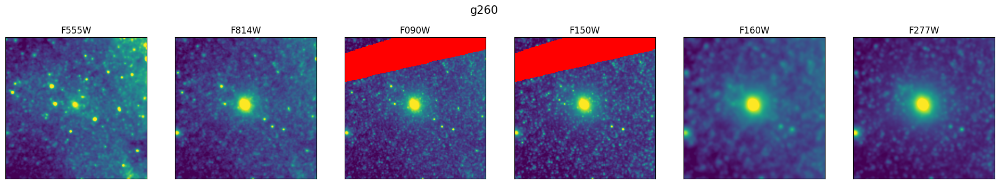

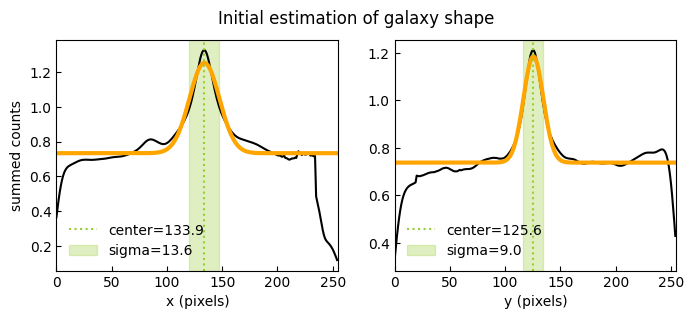

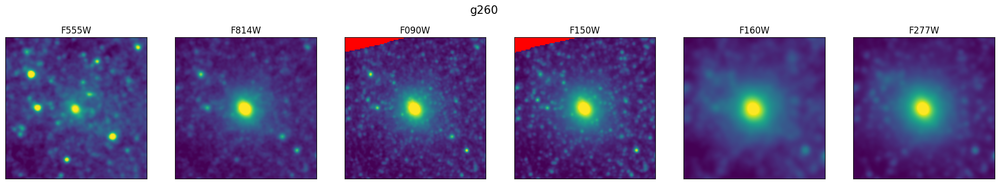

 1.0920e+00 (iter=5: fatol=1.09e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:59<00:00,  7.39s/it]

 1.1205e+02 (iter=0)   

 1.2613e+00 (iter=10: fatol=1.28e-03)   

100%|██████████| 8/8 [01:11<00:00,  8.99s/it]

 1.2720e+00    

 1.1470e+00 (iter=10: fatol=1.15e-03)   

100%|██████████| 8/8 [01:09<00:00,  8.65s/it]

 1.1959e+00    

 1.1295e+00 (iter=10: fatol=1.13e-03)   

100%|██████████| 8/8 [01:09<00:00,  8.73s/it]


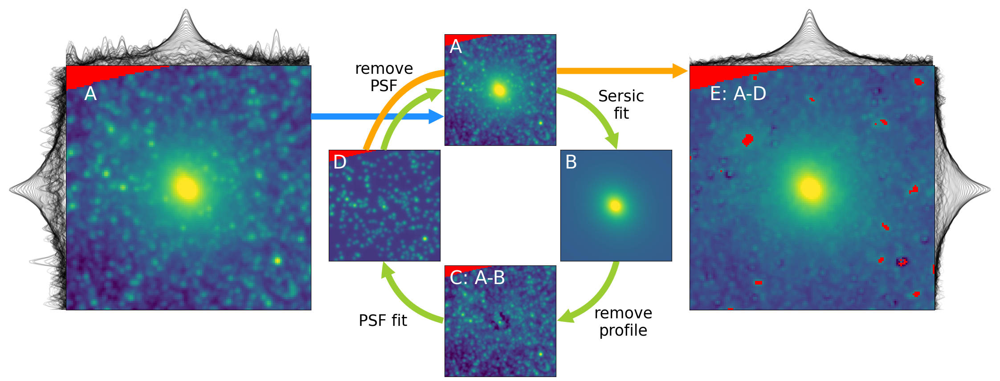

In [11]:
from test import load_and_crop, prep_model
from sphot.psf import PSFFitter
from sphot.fitting import ModelFitter
from sphot.plotting import plot_sphot_results

fit_complex_model = True

# 1. load data & perform initial analysis
galaxy = load_and_crop(datafile,filters,folder_PSF,
                       base_filter)

# 2. select base filter to fit
cutoutdata = galaxy.images[base_filter]
cutoutdata.perform_bkg_stats()
# cutoutdata.determine_psf_blurring()
cutoutdata.blur_psf(4)

# 3. make models & prepare fitters
model_1 = prep_model(cutoutdata,simple=True)
fitter_1 = ModelFitter(model_1,cutoutdata)
if fit_complex_model:
    model_2 = prep_model(cutoutdata,simple=False)
    fitter_2 = ModelFitter(model_2,cutoutdata)
else:
    model_2 = model_1
    fitter_2 = fitter_1
fitter_psf = PSFFitter(cutoutdata)

# 4. fit 
fitter_1.fit(fit_to='data',max_iter=20)
fitter_psf.fit(fit_to='sersic_residual',plot=False)
fitter_2.fit(fit_to='psf_sub_data',
             method='iterative_NM',max_iter=30)
for _ in range(3):
    fitter_2.fit(fit_to='psf_sub_data',method='iterative_NM',max_iter=10)
    fitter_psf.fit(fit_to='sersic_residual',plot=False)
    
# 7. plot the results
plot_sphot_results(cutoutdata)

In [12]:
base_params = cutoutdata.sersic_params


*** working on F555W ***
 1.0445e+00 (iter=1: fatol=1.04e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:12<00:00,  1.54s/it]

 1.2097e+00 (iter=0)   

 9.3050e-01 (iter=10: fatol=9.31e-04)   

100%|██████████| 8/8 [00:16<00:00,  2.04s/it]

 9.0115e-01 (iter=0)   

 8.9050e-01 (iter=10: fatol=8.89e-04)   

100%|██████████| 8/8 [00:14<00:00,  1.86s/it]

 8.9059e-01 (iter=0)   

 8.8681e-01 (iter=4: fatol=8.87e-04)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:15<00:00,  1.94s/it]



*** working on F814W ***
 1.0697e+00 (iter=2: fatol=1.07e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:04<00:00,  1.67it/s]

 1.4141e+00 (iter=0)   

 1.0177e+00 (iter=8: fatol=1.02e-03)    
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:06<00:00,  1.26it/s]

 1.0046e+00 (iter=0)   

 9.9919e-01 (iter=7: fatol=9.99e-04)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:06<00:00,  1.21it/s]

 1.0159e+00 (iter=0)   

 9.9982e-01 (iter=1: fatol=1.00e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:06<00:00,  1.22it/s]



*** working on F090W ***
 1.0259e+00 (iter=1: fatol=1.03e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:24<00:00,  3.04s/it]


 1.0447e+00 (iter=10: fatol=1.04e-03)   
Iterative Nelder-Mead method Converged
 1.0447e+00 (iter=1: fatol=1.04e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:30<00:00,  3.76s/it]

 1.0447e+00    

 1.0352e+00 (iter=1: fatol=1.03e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:34<00:00,  4.27s/it]

 1.0340e+00    

 1.0168e+00 (iter=7: fatol=1.02e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:33<00:00,  4.23s/it]



*** working on F150W ***
 9.4741e-01 (iter=1: fatol=9.47e-04)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:42<00:00,  5.27s/it]


 1.0768e+00 (iter=2: fatol=1.08e-03)    
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:35<00:00,  4.38s/it]


 1.0519e+00 (iter=5: fatol=1.05e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:36<00:00,  4.57s/it]


 1.0661e+00 (iter=3: fatol=1.07e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:37<00:00,  4.67s/it]



*** working on F160W ***
 1.6365e+00 (iter=2: fatol=1.64e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:10<00:00,  1.28s/it]

 1.6542e+01 (iter=0)   

 9.2932e-01 (iter=10: fatol=9.29e-04)   

100%|██████████| 8/8 [00:14<00:00,  1.76s/it]

 1.0793e+01 (iter=0)   

 8.5786e-01 (iter=6: fatol=8.58e-04)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:10<00:00,  1.33s/it]

 1.0630e+01 (iter=0)   

 9.0245e-01 (iter=4: fatol=9.02e-04)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:15<00:00,  1.98s/it]



*** working on F277W ***
 5.4236e+00 (iter=1: fatol=5.42e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:01<00:00,  6.10it/s]

 6.5992e+00    

 1.3471e+00 (iter=10: fatol=1.35e-03)   

100%|██████████| 8/8 [00:01<00:00,  4.90it/s]

 1.3553e+00    

 1.3352e+00 (iter=10: fatol=1.34e-03)   

100%|██████████| 8/8 [00:01<00:00,  4.67it/s]

 1.3428e+00    

 1.3258e+00 (iter=10: fatol=1.33e-03)   

100%|██████████| 8/8 [00:02<00:00,  3.29it/s]


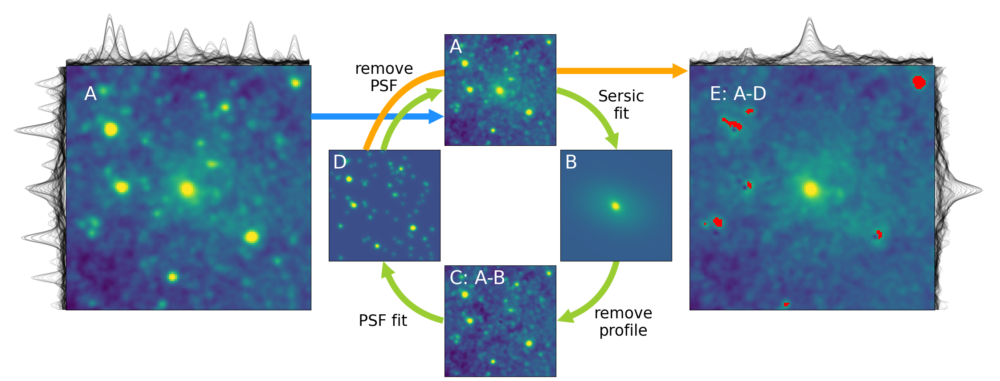

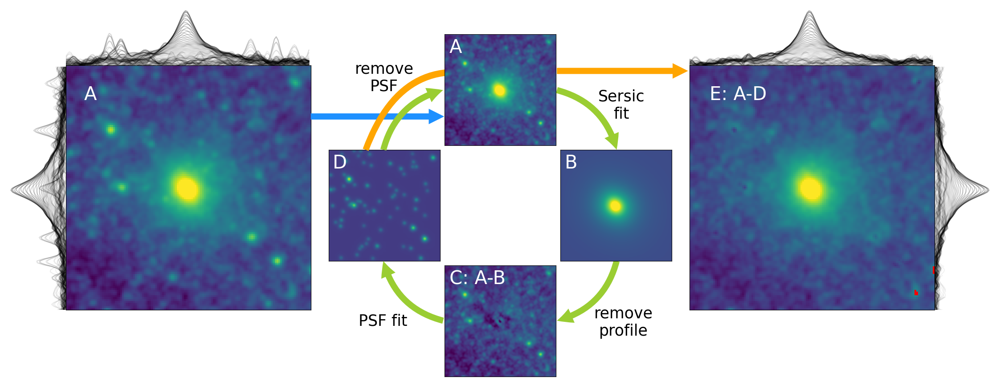

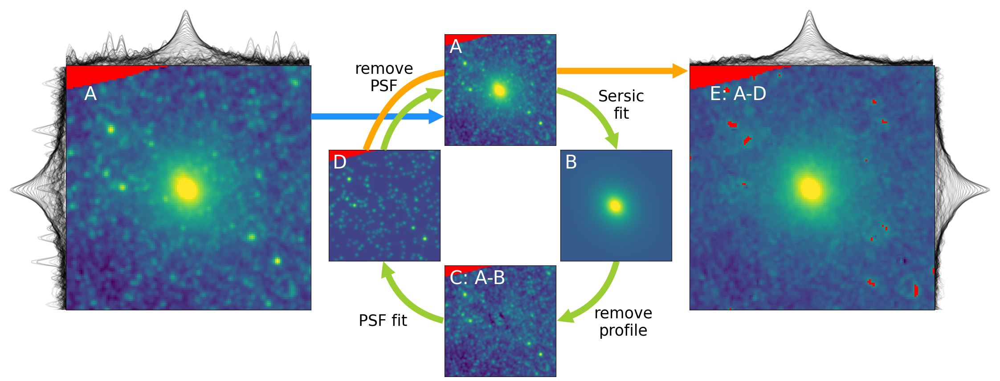

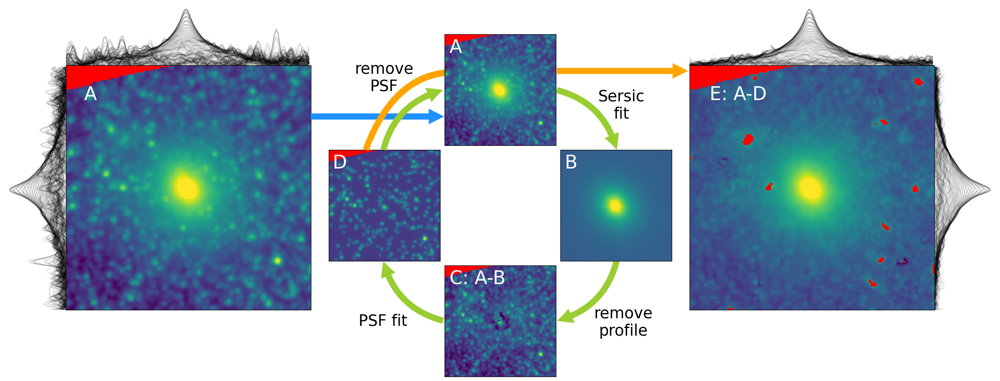

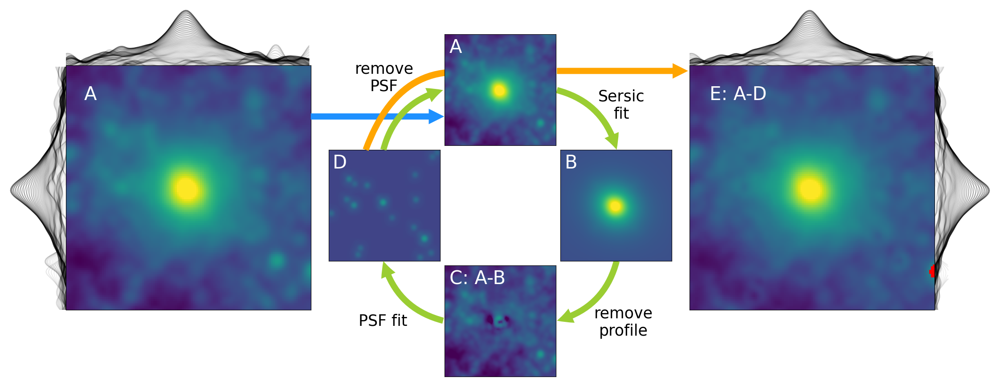

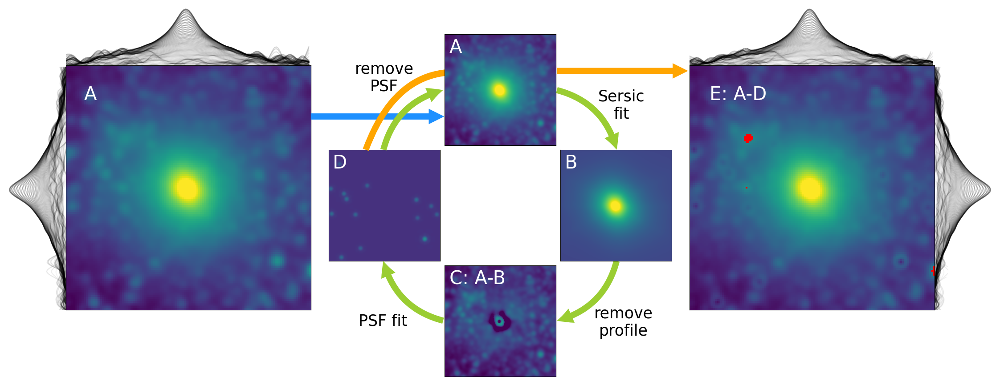

In [13]:
from sphot.fitting import ModelScaleFitter

for filt in galaxy.filters:
    print(f'\n*** working on {filt} ***')
    _cutoutdata = galaxy.images[filt]
    
    # basic statistics
    _cutoutdata.perform_bkg_stats()
    # _cutoutdata.determine_psf_blurring()
    _cutoutdata.blur_psf(4)

    # initialize model and fitters
    _model = prep_model(_cutoutdata,simple=False)
    _fitter_scale = ModelScaleFitter(_model,_cutoutdata,base_params)
    _fitter_2 = ModelFitter(_model,_cutoutdata)
    _fitter_psf = PSFFitter(_cutoutdata)
    
    # run fitting
    _fitter_scale.fit(fit_to='data')
    _fitter_psf.fit(fit_to='sersic_residual',plot=False)
    _fitter_2.model.x0 = _cutoutdata.sersic_params
    _fitter_2.fit(fit_to='psf_sub_data',max_iter=20)
    for _ in range(3):
        _fitter_2.fit(fit_to='psf_sub_data')
        _fitter_psf.fit(fit_to='sersic_residual',plot=False)
        
    plot_sphot_results(_cutoutdata)

In [196]:
galaxy.name

'g260'

In [193]:
galaxy.save('g260.h5')

Saved to test.h5


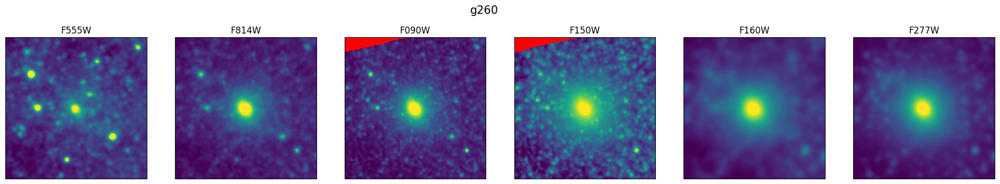

In [197]:
from sphot.data import read_sphot_h5

galaxy_loaded = read_sphot_h5('g260_sphot.h5')
galaxy_loaded.plot()

# Aperture photometry

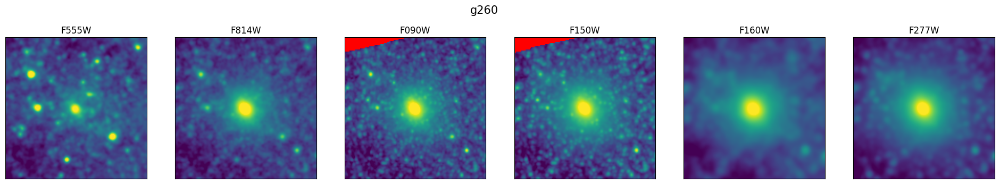

In [209]:
import numpy as np
import matplotlib.pyplot as plt
from sphot.data import calc_mag
from sphot.fitting import profile_stats, do_aperture_photometry
from sphot.plotting import astroplot
from sphot.data import read_sphot_h5

galaxy_loaded = read_sphot_h5('test.h5')
galaxy_loaded.plot()

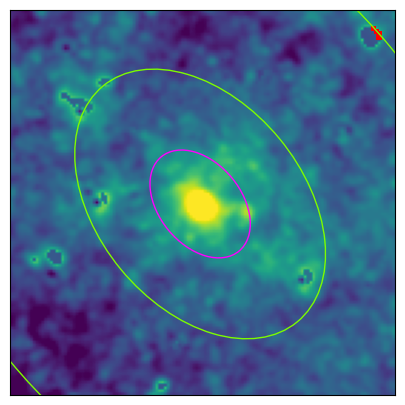

flux_frac 0.6199203747726426
F555W: mAB = 22.80 +/- 0.05


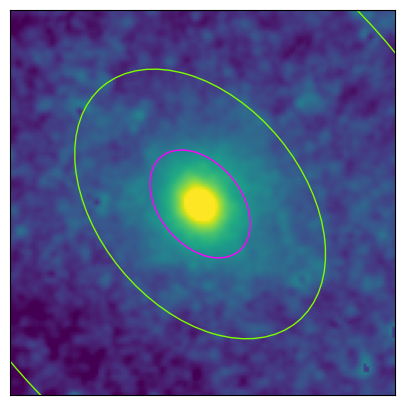

flux_frac 0.6199203747726426
F814W: mAB = 20.52 +/- 0.05


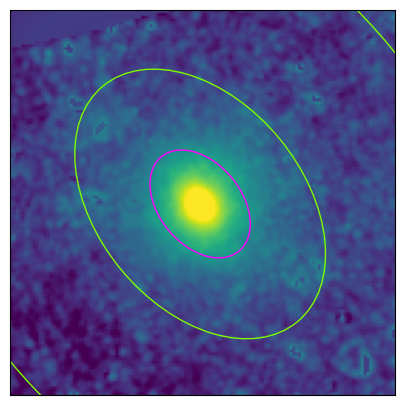

flux_frac 0.6199203747726426
F090W: mAB = 20.16 +/- 0.05


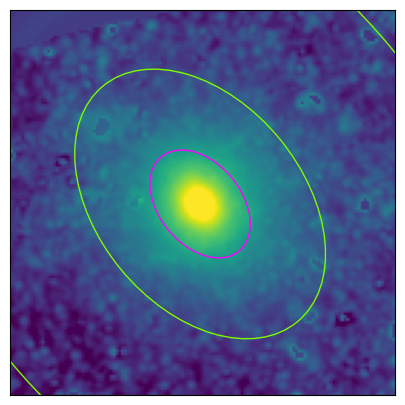

flux_frac 0.6199203747726426
F150W: mAB = 19.16 +/- 0.05


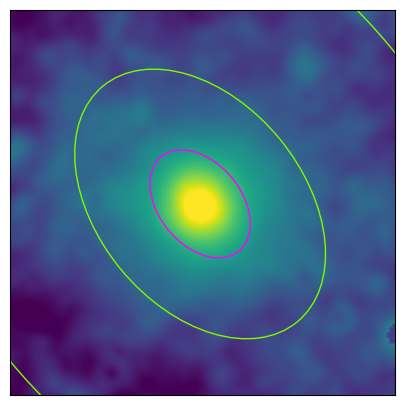

flux_frac 0.6199203747726426
F160W: mAB = 19.25 +/- 0.05


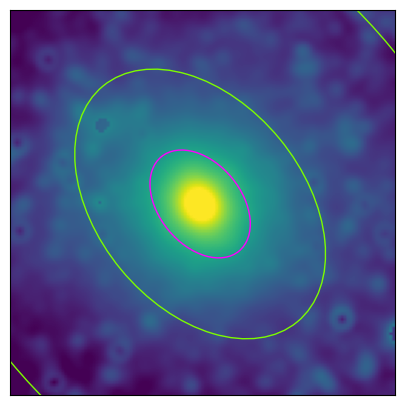

flux_frac 0.6199203747726426
F277W: mAB = 18.62 +/- 0.05


In [210]:
mags = []
mag_errors = []

aperture_size = 1
for filt in galaxy.filters:
    stats = profile_stats(galaxy_loaded.images[filt],
                          sersic_params=galaxy_loaded.images[base_filter].sersic_params_physical)
    counts,counts_error,offset = do_aperture_photometry(stats,
                                                   aperture_size=1,
                                                   annulus_size=[2.5,6])
    
    # calculate flux fraction within aperture size
    stats_model = profile_stats(galaxy_loaded.images[base_filter],fit_to='sersic_modelimg')
    aper_loc = np.argmin(np.abs(stats_model.a_vals/stats_model.r_eff - aperture_size))
    flux_frac = stats_model.flux_contained[aper_loc] / stats_model.flux_contained[-1]
    print('flux_frac',flux_frac)
    
    # calculate total flux & add fractional error
    total_flux = counts/flux_frac
    counts_error = np.sqrt((total_flux*0.05)**2 + counts_error**2)
    
    # calculate the magnitude
    mag,mag_error = calc_mag(total_flux,counts_error)
    mags.append(mag)
    mag_errors.append(mag_error)
    print(f'{filt}: mAB = {mag:.2f} +/- {mag_error:.2f}')

In [208]:
import pandas as pd
pd.DataFrame([galaxy.filters,mags,mag_errors]).T

,0,1,2
0,F555W,22.974854,0.054439
1,F814W,20.554434,0.054294
2,F090W,20.168527,0.054292
3,F150W,19.14786,0.054289
4,F160W,19.262499,0.054289
5,F277W,18.63096,0.054288


In [90]:
import pandas as pd
pd.DataFrame([galaxy.filters,mags,mag_errors]).T

,0,1,2
0,F555W,22.187957,0.054441
1,F814W,20.49052,0.054296
2,F090W,20.128465,0.054296
3,F150W,19.157271,0.05429
4,F160W,19.202103,0.054291
5,F277W,18.643311,0.054289


In [92]:
filters

['F555W', 'F814W', 'F090W', 'F150W', 'F160W', 'F277W']

In [94]:
np.save('g260_ABmags.npy',[filters,mags,mag_errors])

In [66]:
np.load('../sample_data/g260_ABmags.npy')

array([['F555W', 'F814W', 'F160W', 'F090W', 'F150W', 'F277W'],
       ['23.241392720706514', '20.769530122372263', '19.40006449759578',
        '20.34818556102629', '19.336383762660592', '18.81111137868564'],
       ['0.06553671104958995', '0.019273761025851186',
        '0.01091202595676499', '0.022974260881049785',
        '0.02085723945752944', '0.03386777044072049']], dtype='<U32')

(<matplotlib.colors.LogNorm at 0x160100690>, 0.14196163735515527)

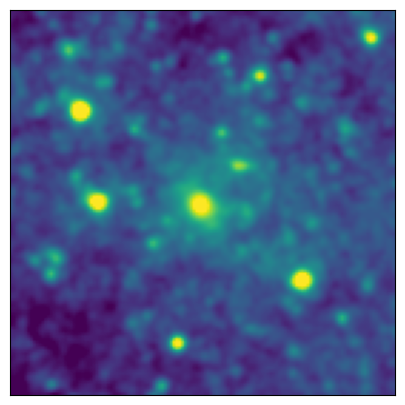

In [81]:
astroplot(galaxy.images['F555W'].data)

(<matplotlib.colors.LogNorm at 0x178e1ae50>, 0.3467735133480919)

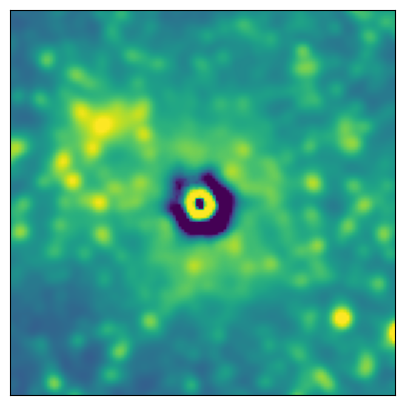

In [50]:
from sphot.plotting import astroplot
astroplot(galaxy.images['F277W'].sersic_residual)

In [57]:
plot_sphot_results(cutoutdata)

-0.02365694472443042

In [71]:
filt = 'F160W'
cutoutdata_filt = galaxy_crop.images[filt]
sigma_psf = fwhm_dict[filt].value/2#.355

# basic statistics
cutoutdata_filt.galaxy_size = galaxy_size
cutoutdata_filt.perform_bkg_stats()

# initialize model and fitters
model_filt = prep_model(cutoutdata_filt,simple=False)
scale_fitter = ModelScaleFitter(model_filt,cutoutdata_filt,base_params=base_params)
psf_fitter_filt = PSFFitter(cutoutdata_filt,sigma_psf)

# run fitting
scale_fitter.fit(fit_to='data')
psf_fitter_filt.fit(fit_to='sersic_residual',plot=False)
for _ in range(3):
    scale_fitter.fit(fit_to='psf_sub_data')
    psf_fitter_filt.fit(fit_to='sersic_residual',plot=False)

 3.6748e+00 (iter=2: fatol=3.67e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:13<00:00,  1.75s/it]

 6.9619e+00 (iter=0)   

 5.1163e+00 (iter=1: fatol=5.12e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:14<00:00,  1.80s/it]

 5.0607e+00 (iter=0)   

 4.7013e+00 (iter=1: fatol=4.70e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:15<00:00,  1.95s/it]

 5.2235e+00 (iter=0)   

 4.5068e+00 (iter=1: fatol=4.51e-03)   
Iterative Nelder-Mead method Converged


100%|██████████| 8/8 [00:14<00:00,  1.83s/it]


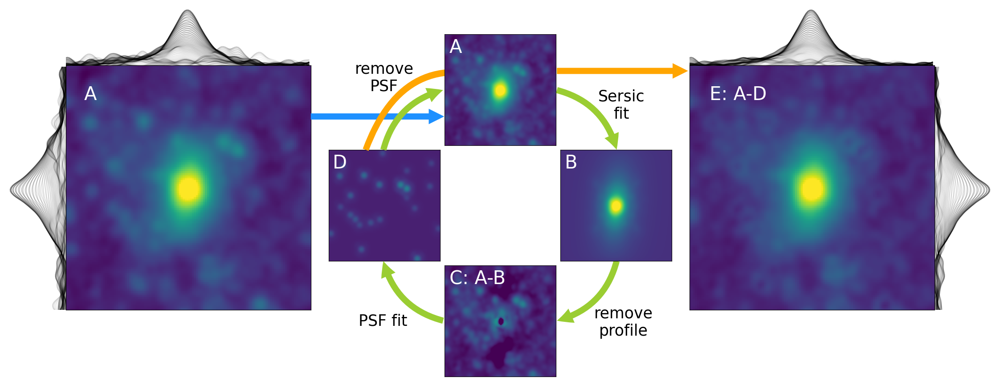

In [69]:
plot_sphot_results(galaxy_crop.images[filt])

In [35]:
scale_fitter.fit()

 2.0088e-01 (iter=1: fatol=2.01e-04)   
Iterative Nelder-Mead method Converged


AttributeError: 'CutoutData' object has no attribute '_bkg_level'

# Other filters

Working on: F555W

fitting flux scale...
 8.9497e+01 (iter=1: fatol=8.95e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:16<00:00,  2.01s/it]


fitting flux scale...
 3.9850e+00 (iter=0)   

 1.5821e+00 (iter=2: fatol=1.58e-03)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:16<00:00,  2.05s/it]


fitting flux scale...
 1.7891e+00 (iter=0)   

 1.6065e+00 (iter=2: fatol=1.61e-03)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.65s/it]


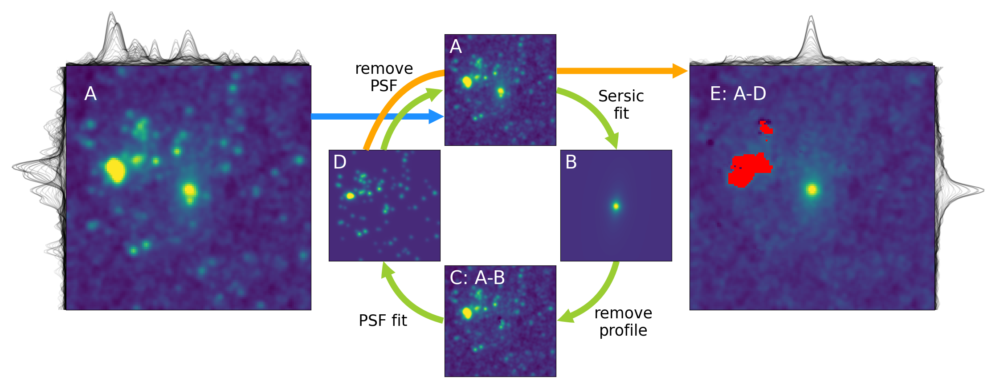

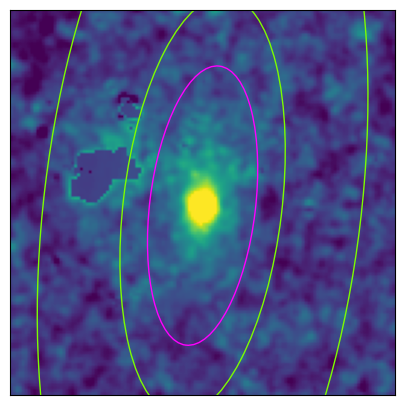

<class 'filter'>: mAB=23.544 +/- 0.007
Working on: F814W

fitting flux scale...
 5.2787e+01 (iter=1: fatol=5.28e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.72s/it]


fitting flux scale...
 1.3529e+01 (iter=0)   

 1.0008e+01 (iter=2: fatol=1.00e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.67s/it]


fitting flux scale...
 1.2476e+01 (iter=0)   

 9.9156e+00 (iter=2: fatol=9.91e-03)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.70s/it]


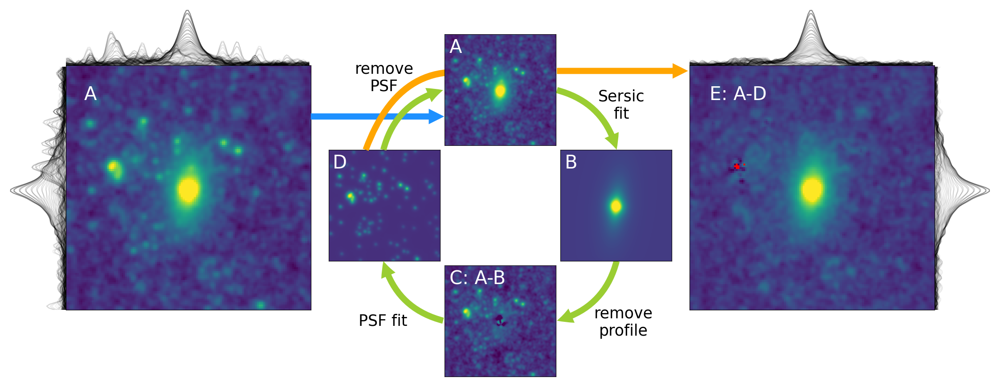

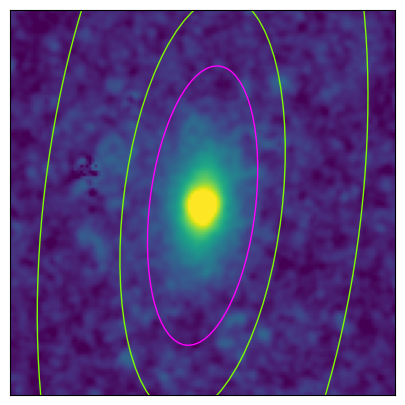

<class 'filter'>: mAB=21.368 +/- 0.002
Working on: F090W

fitting flux scale...
 1.0228e+02 (iter=1: fatol=1.02e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:11<00:00,  8.95s/it]


fitting flux scale...
 3.4115e+01    

 3.0084e+01 (iter=1: fatol=3.01e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:53<00:00,  6.70s/it]



fitting flux scale...
 3.0802e+01 (iter=1: fatol=3.08e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:07<00:00,  8.49s/it]


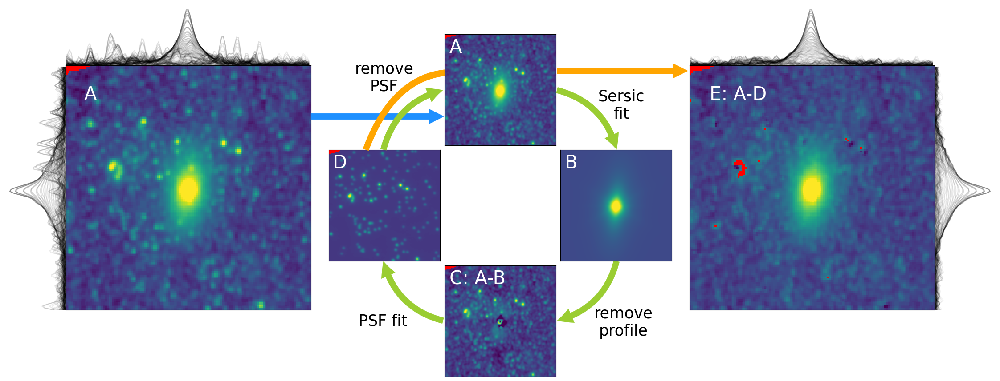

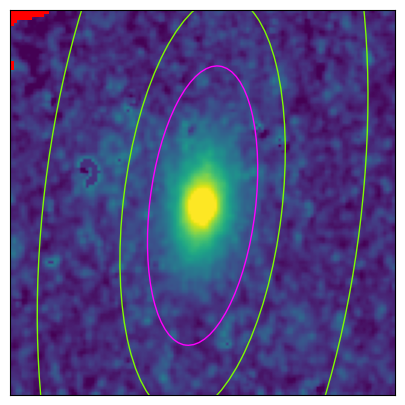

<class 'filter'>: mAB=21.026 +/- 0.002
Working on: F150W

fitting flux scale...
 3.6739e+02 (iter=2: fatol=3.67e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:15<00:00,  9.38s/it]



fitting flux scale...
 1.3301e+02 (iter=2: fatol=1.33e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:17<00:00,  9.75s/it]


fitting flux scale...
 1.6048e+02    

 1.3067e+02 (iter=2: fatol=1.31e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:16<00:00,  9.53s/it]


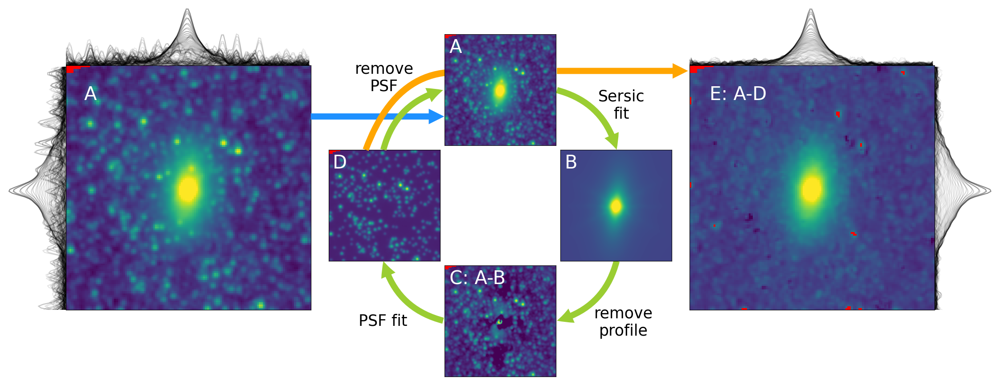

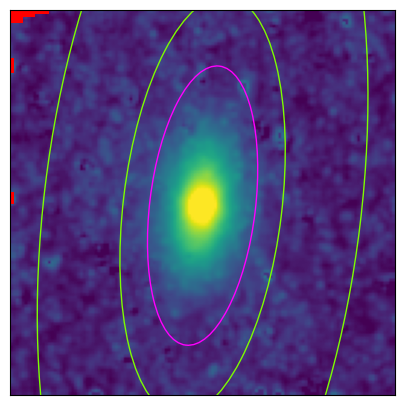

<class 'filter'>: mAB=20.032 +/- 0.001
Working on: F160W

fitting flux scale...
 5.7077e+01 (iter=2: fatol=5.71e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:14<00:00,  1.84s/it]


fitting flux scale...
 1.8804e+03 (iter=0)   

 3.5995e+01 (iter=2: fatol=3.60e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.64s/it]


fitting flux scale...
 1.8202e+03 (iter=0)   

 3.7477e+01 (iter=2: fatol=3.75e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:13<00:00,  1.63s/it]


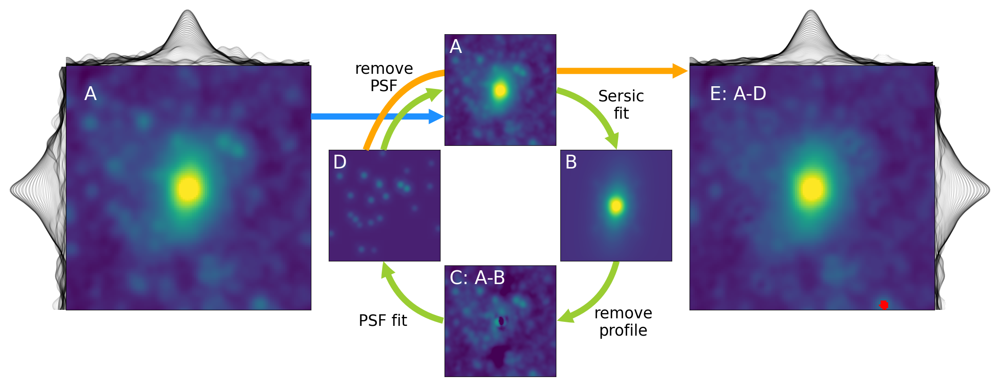

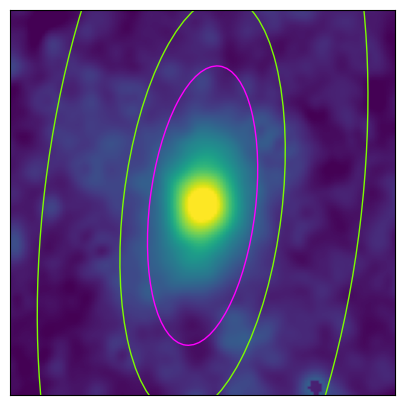

<class 'filter'>: mAB=20.124 +/- 0.001
Working on: F277W

fitting flux scale...
 1.1717e+02 (iter=2: fatol=1.17e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:06<00:00,  1.24it/s]


fitting flux scale...
 1.9223e+03    

 1.0347e+02 (iter=2: fatol=1.03e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:06<00:00,  1.23it/s]


fitting flux scale...
 1.9153e+03    

 1.0098e+02 (iter=1: fatol=1.01e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:07<00:00,  1.09it/s]


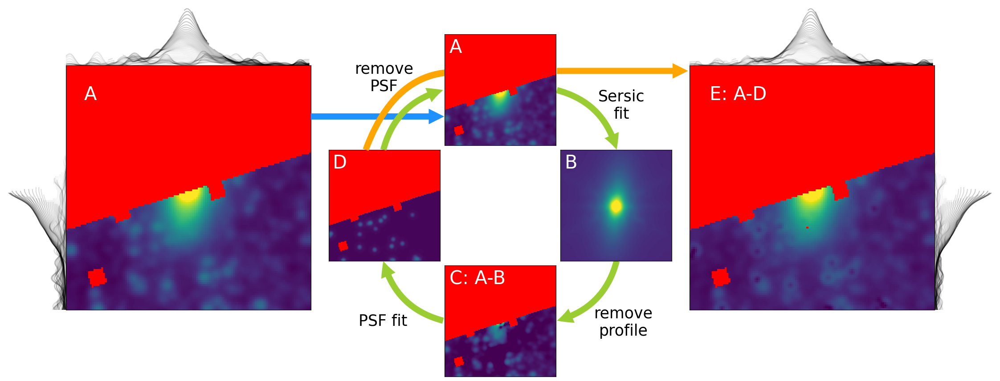

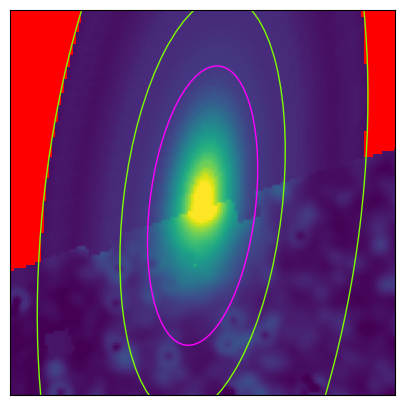

<class 'filter'>: mAB=19.586 +/- 0.013


In [167]:
for filt in filters:
    print('Working on:',filt)
    try:
        psf_sigma = fwhm_dict[filt].value/2
        cutoutdata = galaxy_crop.images[filt]
        cutoutdata = perform_bkg_stats(cutoutdata,galaxy_size)

        model = prep_model(cutoutdata,galaxy_size,simple=False)
        #### MAIN LOOP ####
        for i in range(N_mainloop_iter):
            # fit Sersic model
            sersic_results = fit_fixed_profile(model,cutoutdata,bestfit_sersic_params)
            fitter, scaled_sersic_params, bestfit_sersic_img, sersic_residual = sersic_results

            # perform PSF photometry and subtraction
            psf_results = fit_psf(sersic_residual,cutoutdata,psf_sigma,galaxy_size,plot=False)
            psf_subtracted_data_bksub, psf_subtracted_data_bksub_error, psf_model_total, psf_table = psf_results
            cutoutdata.psf_table = psf_table
            cutoutdata.data = psf_subtracted_data_bksub
            cutoutdata.error = psf_subtracted_data_bksub_error
            
        plot_sphot_results(cutoutdata._rawdata - cutoutdata._bkg_level,
                            bestfit_sersic_img,sersic_residual,
                            psf_model_total,psf_subtracted_data_bksub)
        plt.show()
        
        # perform aperture photometry
        bestfit_sersic_params_physical = dict(zip(fitter.model.free_params,
                                                fitter.unstandardize_params(scaled_sersic_params)))
        counts,error,profile=do_aperture_photometry(cutoutdata,
                                                    bestfit_sersic_params_physical,
                                                    plot=True)
        mag,mag_err = calc_mag(counts,error)
        cutoutdata.counts = counts
        cutoutdata.counts_error = error
        cutoutdata.profile = profile
        cutoutdata.mag = mag
        cutoutdata.mag_err = mag_err
        print(f'{filter}: mAB={mag:.3f} +/- {mag_err:.3f}')
    except Exception as e:
        print(f'Failed: {filt}',e)



fitting flux scale...
 1.0228e+02 (iter=1: fatol=1.02e-01)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:09<00:00,  8.66s/it]



fitting flux scale...
 3.0084e+01 (iter=1: fatol=3.01e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [00:52<00:00,  6.58s/it]


fitting flux scale...
 3.4944e+01    

 3.0802e+01 (iter=1: fatol=3.08e-02)   
Iterative Nelder-Mead method Converged

performing PSF subtraction...


100%|██████████| 8/8 [01:13<00:00,  9.19s/it]


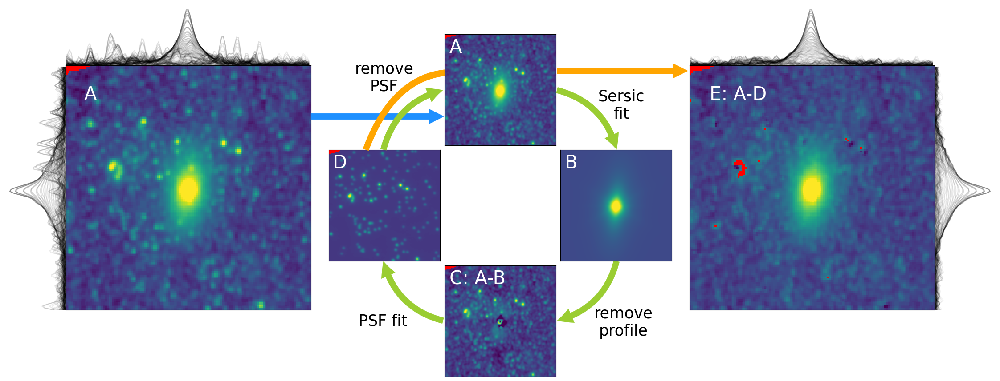

In [119]:
filt = 'F090W'
cutoutdata = galaxy_crop.images[filt]
cutoutdata = perform_bkg_stats(cutoutdata,galaxy_size)

model = prep_model(cutoutdata,galaxy_size,simple=False)

#### MAIN LOOP ####
for i in range(N_mainloop_iter):
    # fit Sersic model
    sersic_results = fit_fixed_profile(model,cutoutdata,bestfit_sersic_params)
    fitter, scaled_sersic_params, bestfit_sersic_img, sersic_residual = sersic_results

    # perform PSF photometry and subtraction
    psf_results = fit_psf(sersic_residual,cutoutdata,fwhm_dict[filt].value/2,galaxy_size,plot=False)
    psf_subtracted_data_bksub, psf_subtracted_data_bksub_error, psf_model_total, psf_table = psf_results
    cutoutdata.psf_table = psf_table
    cutoutdata.data = psf_subtracted_data_bksub
    cutoutdata.error = psf_subtracted_data_bksub_error
    
plot_sphot_results(cutoutdata._rawdata - cutoutdata._bkg_level,
                    bestfit_sersic_img,sersic_residual,
                    psf_model_total,psf_subtracted_data_bksub)
plt.show()

In [169]:
fractional_error = 0.05
for filt in filters:
    cutoutdata = galaxy_crop.images[filt]
    _counts_err = np.sqrt(cutoutdata.counts_error**2 + (cutoutdata.counts*fractional_error)**2)
    _mag,_err = calc_mag(cutoutdata.counts,_counts_err)
    print(f'{filt}: mAB = {_mag:.3f} +/- {_err:.3f}')

# F555W 23.54
# F814W 21.36
# F090W 21.02
# 150W 20.03
# F160W 20.12

F555W: mAB = 23.544 +/- 0.055
F814W: mAB = 21.368 +/- 0.054
F090W: mAB = 21.026 +/- 0.054
F150W: mAB = 20.032 +/- 0.054
F160W: mAB = 20.124 +/- 0.054
F277W: mAB = 19.586 +/- 0.056


In [11]:
np.load('../sample_data/g310_ABmags.npy',allow_pickle=True)#.item()

array([['F555W', 'F814W', 'F160W', 'F090W', 'F150W', 'F277W'],
       ['22.987', '20.852', '19.614', '20.444', '19.571', '19.046'],
       ['0.133', '0.05', '0.026', '0.053', '0.03', '0.032']], dtype='<U32')

In [22]:
from sedpy import observate
filt_object = observate.Filter('jwst_f150w')
filt_object.name

'jwst_f150w'

In [12]:
mag_info_str = '''
F555W 23.544 0.055
F814W 21.368 0.054
F090W 21.026 0.054
F150W 20.032 0.054
F160W 20.124 0.054
F277W 19.586 0.056
'''
mag_filters,mag_values,mag_errors = np.array(mag_info_str.split()).reshape(-1,3).T
np.save('g310_ABmags.npy', [mag_filters,mag_values,mag_errors])

dmag mean: 0.011
dmag std: 0.450


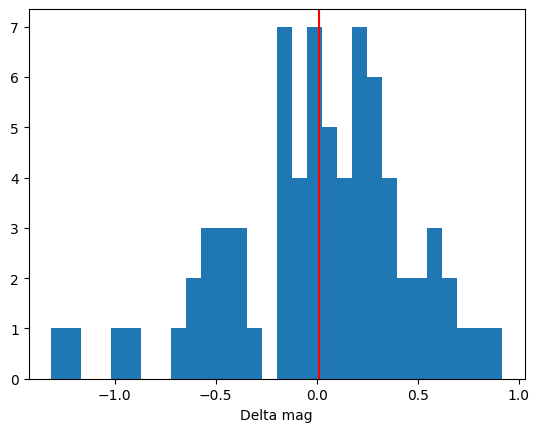

In [187]:
import pandas as pd
table1 = galaxy_crop.images['F814W'].psf_table
table2 = galaxy_crop.images['F090W'].psf_table
matched_sources = pd.DataFrame(columns=['x1','y1','x2','y2','dist','flux1','flux2'])
for i in range(len(table1)):
    row = table1[i]
    x1,y1,flux1 = row['x_fit'],row['y_fit'],row['flux_fit']
    xdist = np.abs(table2['x_fit'].value-x1)
    ydist = np.abs(table2['y_fit'].value-y1)
    dist = np.sqrt(xdist**2 + ydist**2)
    idx = np.argmin(dist)
    
    row2 = table2[idx]
    x2,y2,flux2 = row2['x_fit'],row2['y_fit'],row2['flux_fit']
    matched_sources.loc[i] = [x1,y1,x2,y2,dist[idx],flux1,flux2]
    
s = matched_sources['dist'] < 1
flux1 = matched_sources[s]['flux1'].values
flux2 = matched_sources[s]['flux2'].values
dmag = -2.5*np.log10(flux1/flux2)
dmag_mean = dmag.mean()
dmag_std = dmag.std()
plt.hist(dmag,bins=30);
plt.axvline(dmag.mean(),color='r')
plt.xlabel('Delta mag')
print(f'dmag mean: {dmag_mean:.3f}')
print(f'dmag std: {dmag_std:.3f}')

(0.0, 1.0499913211198038)

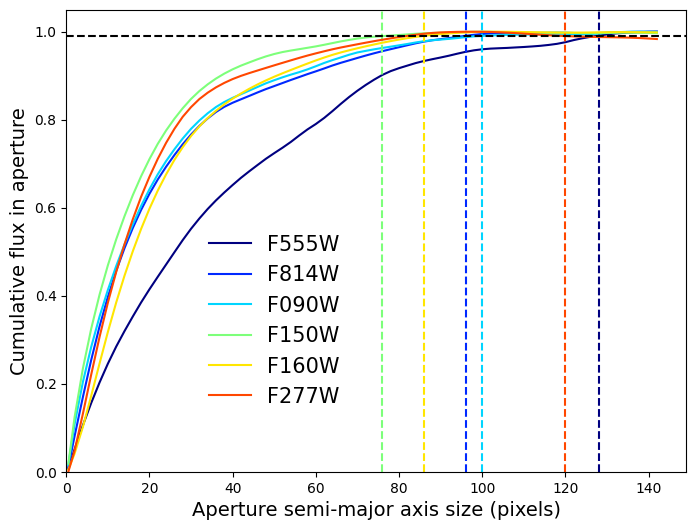

In [186]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
cmap = plt.get_cmap('jet')
for i,filt in enumerate(filters):
    cutoutdata = galaxy_crop.images[filt]
    _,_,profile = do_aperture_photometry(cutoutdata,bestfit_sersic_params_physical,plot=False)
    a_centers,counts_mean,counts_sum = profile
    counts_cumsum = np.cumsum(counts_sum)
    counts_cumsum /= counts_cumsum.max()
    enclosed_99percent_idx = np.argmin(abs(counts_cumsum-0.99))
    aperture_size = a_centers[enclosed_99percent_idx]
    ax.plot(a_centers,counts_cumsum,color=cmap(i/len(filters)),label=filt)
    ax.axvline(aperture_size,color=cmap(i/len(filters)),ls='--')
ax.legend(frameon=False,bbox_to_anchor=(0.2,0.1),loc='lower left',fontsize=15)
ax.set_ylabel('Cumulative flux in aperture',fontsize=14)
ax.set_xlabel('Aperture semi-major axis size (pixels)',fontsize=14)
ax.axhline(0.99,color='k',ls='--')
ax.set_xlim(0,)
ax.set_ylim(0,)
# ax.set_xscale('log')
    
    

In [1]:
model

NameError: name 'model' is not defined

In [161]:
from astropy.modeling.functional_models import Gaussian2D
from astropy.convolution import Gaussian2DKernel,convolve
from astropy.modeling.fitting import LevMarLSQFitter
# make image
shape = (100,100)
xx,yy = np.meshgrid(np.arange(shape[0]),np.arange(shape[1]))
gaussian = models.Gaussian2D(amplitude=1,x_mean=shape[0]/2,y_mean=shape[1]/2,x_stddev=10,y_stddev=10)
original_image = gaussian(xx,yy)

# apply 2D kernel
kernel = Gaussian2DKernel(3,3)
convolved_image = convolve(original_image,kernel)

# fit convolved image
fitter = LevMarLSQFitter()
popt = fitter(gaussiana
              ,xx,yy,convolved_image)

In [162]:
popt

<Gaussian2D(amplitude=0.91746296, x_mean=50., y_mean=50., x_stddev=10.44014064, y_stddev=10.44014064, theta=-0.00094018)>

In [ ]:
from astropy.modeling.fitting import LevMarLSQFitter
import numpy as np
levmar_fitter = LevMarLSQFitter()
shape = fitter_2.shape
xx,yy = np.meshgrid(np.arange(shape[1]),np.arange(shape[0]))
_data = cutoutdata.psf_sub_data.copy()
# _data = np.ma.masked_invalid(_data)
_model = model_2.copy()
_model.parameters = _model.list_to_params(
    fitter_2.unstandardize_params(cutoutdata.sersic_params)
)
s = np.isfinite(_data)
fitted_model = levmar_fitter(_model,
                             xx[s].flatten(),
                             yy[s].flatten(),
                             _data[s].flatten())


NonFiniteValueError: Objective function has encountered a non-finite value, this will cause the fit to fail!
Please remove non-finite values from your input data before fitting to avoid this error.

In [ ]:
levmar_fitter.fit_info

{'nfev': None,
 'fvec': None,
 'fjac': None,
 'ipvt': None,
 'qtf': None,
 'message': None,
 'ierr': None,
 'param_jac': None,
 'param_cov': None}